# **Importing Modules and Libraries**

In [ ]:
# importing required libraries
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import pickle

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn import metrics
from sklearn import preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

# **Importing Datasets**

In [ ]:
import os
from google.colab import drive

drive.mount('/content/drive')
directory_path = '/content/drive/My Drive/cybersummer'
#directory_path = '/content/drive/My Drive/Colab Notebooks/Summer Research' # SKYLER'S Directory Path
dataframes = []

Mounted at /content/drive


In [ ]:
file_path = f"{directory_path}/final_df.csv"
final_df = pd.read_csv(file_path)

final_df.head()

,begin,end,id,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,...,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber,Target
0,0.0,10.0,laneAreaDet_w_l1,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
1,0.0,10.0,laneAreaDet_w_l2,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
2,0.0,10.0,laneAreaDet_w_l3,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
3,0.0,10.0,laneAreaDet_w_l4,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5
4,0.0,10.0,laneAreaDet_w_l5,0.0,0,0,0,-1.0,-1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,5


In [ ]:
print(final_df.shape)

(415872, 27)


In [ ]:
missing_values = final_df.isnull().sum()
print("Missing Values in Each Column:\n", missing_values)
final_df = final_df.dropna()

Missing Values in Each Column:
 begin                          0
end                            0
id                             0
sampledSeconds                 0
nVehEntered                    0
nVehLeft                       0
nVehSeen                       0
meanSpeed                      0
meanTimeLoss                   0
meanOccupancy                  0
maxOccupancy                   0
meanMaxJamLengthInVehicles     0
meanMaxJamLengthInMeters       0
maxJamLengthInVehicles         0
maxJamLengthInMeters           0
jamLengthInVehiclesSum         0
jamLengthInMetersSum           0
meanHaltingDuration            0
maxHaltingDuration             0
haltingDurationSum             0
meanIntervalHaltingDuration    0
maxIntervalHaltingDuration     0
intervalHaltingDurationSum     0
startedHalts                   0
meanVehicleNumber              0
maxVehicleNumber               0
Target                         0
dtype: int64


In [ ]:
X = final_df.drop(columns=['Target'])
y = final_df['Target']

In [ ]:
print(X.dtypes)
# Identify non-numeric columns
non_numeric_columns = X.select_dtypes(include=['object', 'category']).columns
print("Non-numeric columns:", non_numeric_columns)

begin                          float64
end                            float64
id                              object
sampledSeconds                 float64
nVehEntered                      int64
nVehLeft                         int64
nVehSeen                         int64
meanSpeed                      float64
meanTimeLoss                   float64
meanOccupancy                  float64
maxOccupancy                   float64
meanMaxJamLengthInVehicles     float64
meanMaxJamLengthInMeters       float64
maxJamLengthInVehicles           int64
maxJamLengthInMeters           float64
jamLengthInVehiclesSum           int64
jamLengthInMetersSum           float64
meanHaltingDuration            float64
maxHaltingDuration             float64
haltingDurationSum             float64
meanIntervalHaltingDuration    float64
maxIntervalHaltingDuration     float64
intervalHaltingDurationSum     float64
startedHalts                   float64
meanVehicleNumber              float64
maxVehicleNumber         

In [ ]:
X = X.drop(columns=non_numeric_columns)

In [ ]:
X.shape

(415872, 25)

In [ ]:
X.drop(columns=['begin', 'end'])
X.shape

(415872, 25)

# **Data Visualization**

## **Binary Classification**

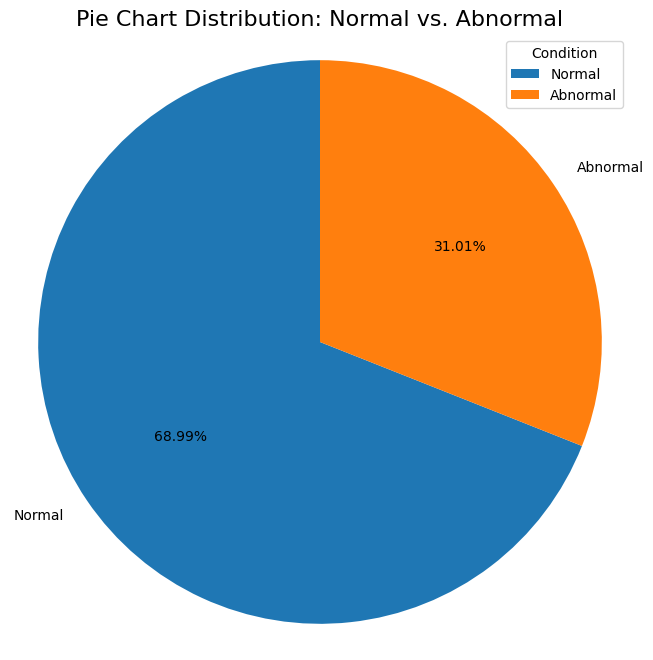

In [ ]:
plt.figure(figsize=(8,8))

# Create a binary classification: 1 for abnormal (0-4), 0 for normal (5)
y_binary = y.apply(lambda x: 'Abnormal' if x < 5 else 'Normal')
binary_counts = y_binary.value_counts()

# normal vs. abnormal
plt.pie(binary_counts, labels=binary_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution: Normal vs. Abnormal", fontsize=16)
plt.legend(title="Condition", loc="best")
plt.axis('equal')
plt.show()

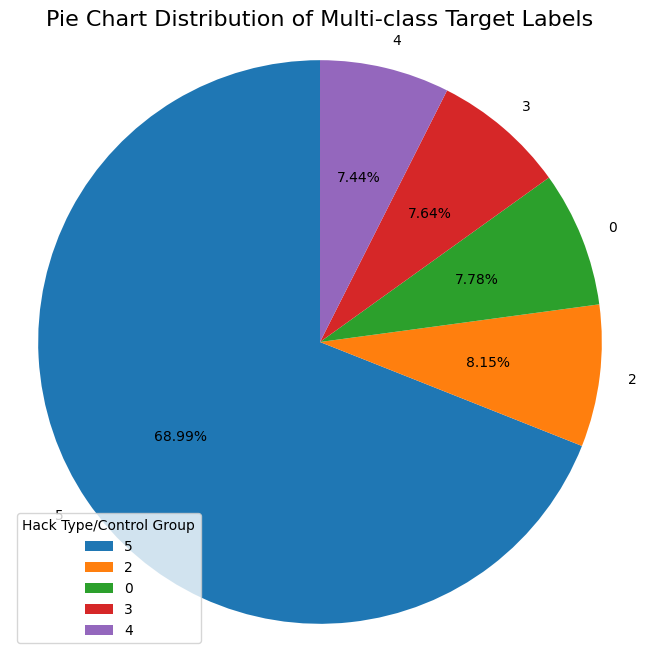

In [ ]:
plt.figure(figsize=(8,8))

target_counts = y.value_counts()

# multi-class
plt.pie(target_counts, labels=target_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution of Multi-class Target Labels", fontsize=16)
plt.legend(title="Hack Type/Control Group", loc="best")
plt.axis('equal')
plt.show()

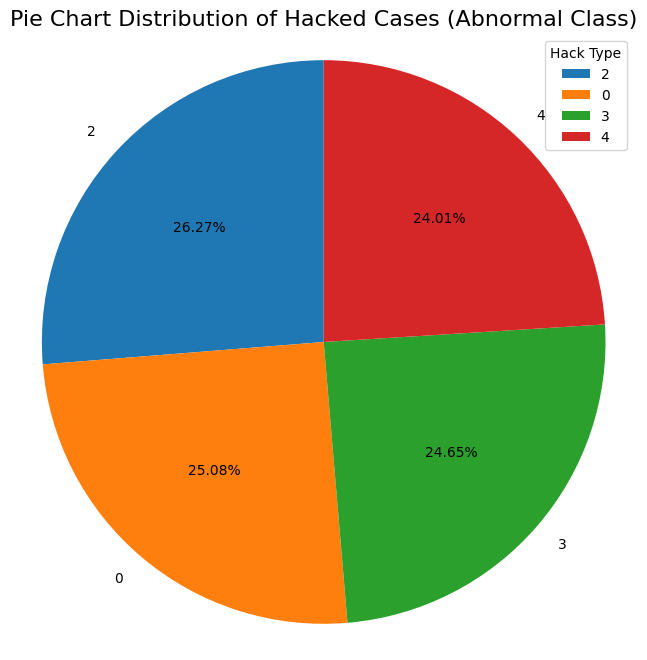

In [ ]:
plt.figure(figsize=(8,8))

abnormal_data = y[y < 5]

abnormal_counts = abnormal_data.value_counts()

# abnormal class
plt.pie(abnormal_counts, labels=abnormal_counts.index, autopct='%0.2f%%', startangle=90)
plt.title("Pie Chart Distribution of Hacked Cases (Abnormal Class)", fontsize=16)
plt.legend(title="Hack Type", loc="best")
plt.axis('equal')
plt.show()

# **Data Normalization**


In [ ]:
# Using MinMaxScaler for normalizing data
minmax_scale = MinMaxScaler(feature_range=(0, 1))

def normalization(df):
    # Applying normalization to all columns in X (no need to exclude 'Target' because it's not in X)
    df_scaled = minmax_scale.fit_transform(df)
    return pd.DataFrame(df_scaled, columns=df.columns)

In [ ]:
# data before normalization
X.head(7)

,begin,end,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,maxOccupancy,...,jamLengthInMetersSum,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber
0,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
5,0.0,10.0,7.0,2,0,2,4.7,2.48,7.1,20.28,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.7,2
6,0.0,10.0,0.0,0,0,0,-1.0,-1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
# Normalizing X (features)
X_normalized = normalization(X.copy())

In [ ]:
# Data after normalization
print(X_normalized.head(7))

   begin  end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
1    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
2    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
3    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
4    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   
5    0.0  0.0        0.029167     0.153846       0.0  0.074074   0.209328   
6    0.0  0.0        0.000000     0.000000       0.0  0.000000   0.000000   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  jamLengthInMetersSum  \
0      0.000000       0.000000      0.000000  ...                   0.0   
1      0.000000       0.000000      0.000000  ...                   0.0   
2      0.000000       0.000000      0.000000  ...                   0.0   
3      0.000000       0.000000      0.000000  ...                   0.0   
4      0

# **Label Encoding**

## **Binary Labels**

In [ ]:
# Changing Target labels into two categories 'normal' and 'abnormal'
bin_label = pd.DataFrame(y.map(lambda x: 'normal' if x == 5 else 'abnormal'))

In [ ]:
# Creating a DataFrame with binary labels (normal, abnormal)
bin_data = X.copy()  # Copy features
bin_data['Target'] = bin_label

In [ ]:
# Label encoding (0 for 'abnormal', 1 for 'normal') binary labels
le1 = preprocessing.LabelEncoder()
enc_label = bin_label.apply(le1.fit_transform)
bin_data['Target'] = enc_label

In [ ]:
# np.save("le1_classes.npy", le1.classes_, allow_pickle=True)

print(bin_data.head())

   begin   end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  10.0             0.0            0         0         0       -1.0   
1    0.0  10.0             0.0            0         0         0       -1.0   
2    0.0  10.0             0.0            0         0         0       -1.0   
3    0.0  10.0             0.0            0         0         0       -1.0   
4    0.0  10.0             0.0            0         0         0       -1.0   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  meanHaltingDuration  \
0          -1.0            0.0           0.0  ...                  0.0   
1          -1.0            0.0           0.0  ...                  0.0   
2          -1.0            0.0           0.0  ...                  0.0   
3          -1.0            0.0           0.0  ...                  0.0   
4          -1.0            0.0           0.0  ...                  0.0   

   maxHaltingDuration  haltingDurationSum  meanIntervalHaltingDuration  \
0           

## **Multi-class Labels**

In [ ]:
multi_label = pd.get_dummies(y, prefix='Target').astype(int)

In [ ]:
multi_data = X.copy()  # Copy features
multi_data = pd.concat([multi_data, multi_label], axis=1)

In [ ]:
print(multi_data.head())

   begin   end  sampledSeconds  nVehEntered  nVehLeft  nVehSeen  meanSpeed  \
0    0.0  10.0             0.0            0         0         0       -1.0   
1    0.0  10.0             0.0            0         0         0       -1.0   
2    0.0  10.0             0.0            0         0         0       -1.0   
3    0.0  10.0             0.0            0         0         0       -1.0   
4    0.0  10.0             0.0            0         0         0       -1.0   

   meanTimeLoss  meanOccupancy  maxOccupancy  ...  maxIntervalHaltingDuration  \
0          -1.0            0.0           0.0  ...                         0.0   
1          -1.0            0.0           0.0  ...                         0.0   
2          -1.0            0.0           0.0  ...                         0.0   
3          -1.0            0.0           0.0  ...                         0.0   
4          -1.0            0.0           0.0  ...                         0.0   

   intervalHaltingDurationSum  startedHalts 

# **Correlation between features of dataset**

In [ ]:
# Define num_col for numeric columns (excluding 'Target')
num_col = list(X.select_dtypes(include='number').columns)

if 'Target' in num_col:
    num_col.remove('Target')

## **Correlation Matrix for Binary Labels**

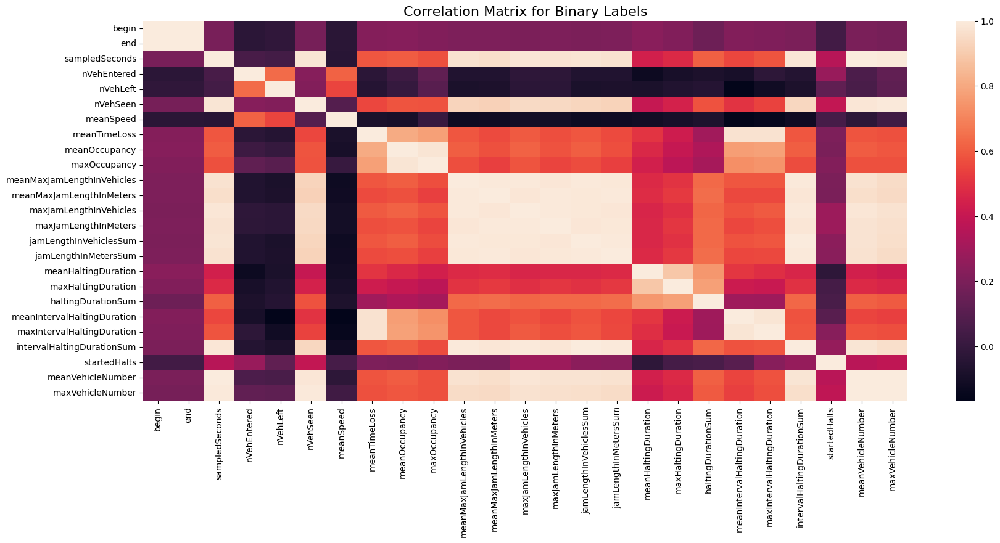

In [ ]:
# Correlation matrix for binary labels
plt.figure(figsize=(20, 8))
corr_bin = bin_data[num_col].corr()
sns.heatmap(corr_bin, vmax=1.0, annot=False)
plt.title('Correlation Matrix for Binary Labels', fontsize=16)
plt.show()

## **Correlation Matrix for Multi-class Labels**

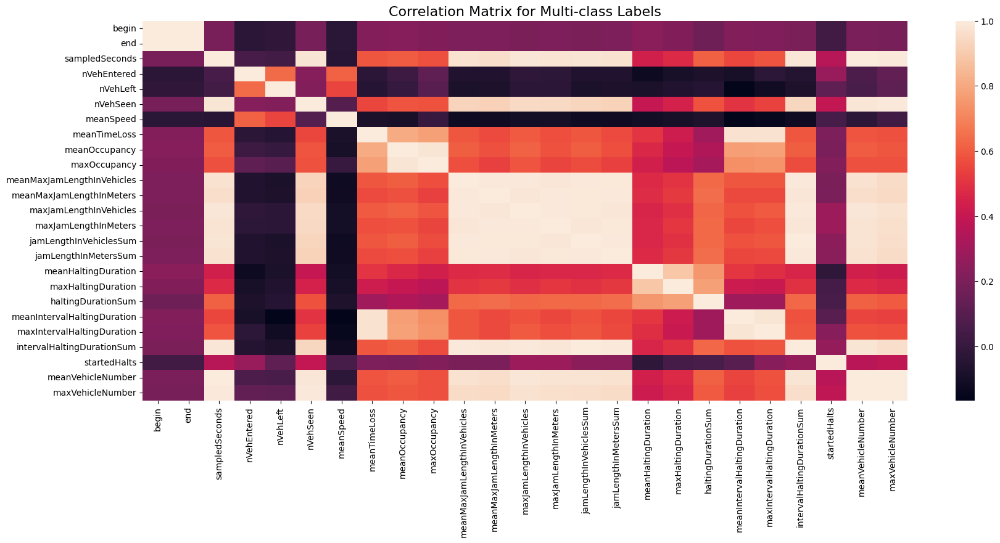

In [ ]:
# Correlation matrix for multi-class labels
plt.figure(figsize=(20, 8))
corr_multi = multi_data[num_col].corr()
sns.heatmap(corr_multi, vmax=1.0, annot=False)
plt.title('Correlation Matrix for Multi-class Labels', fontsize=16)
plt.show()

# **BINARY CLASSIFICATION**

## **Data Splitting**



In [ ]:
X = bin_data.drop(columns=['Target'], axis=1)
Y = bin_data['Target']

In [ ]:
X.head()

,begin,end,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,maxOccupancy,...,jamLengthInMetersSum,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber
0,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,10.0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
X = X.drop(columns=['begin', 'end'])

In [ ]:
X.head()

,sampledSeconds,nVehEntered,nVehLeft,nVehSeen,meanSpeed,meanTimeLoss,meanOccupancy,maxOccupancy,meanMaxJamLengthInVehicles,meanMaxJamLengthInMeters,...,jamLengthInMetersSum,meanHaltingDuration,maxHaltingDuration,haltingDurationSum,meanIntervalHaltingDuration,maxIntervalHaltingDuration,intervalHaltingDurationSum,startedHalts,meanVehicleNumber,maxVehicleNumber
0,0.0,0,0,0,-1.0,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0.0,0,0,0,-1.0,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0,0,0,-1.0,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0.0,0,0,0,-1.0,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.0,0,0,0,-1.0,-1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
Y.head()

,Target
0,1
1,1
2,1
3,1
4,1


In [ ]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.20, random_state=50)

In [ ]:

from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.1)

lasso.fit(X_train, y_train)

# Get the coefficients (weights) of the Lasso model
coefficients = lasso.coef_
print(coefficients)



[-0.00000000e+00  0.00000000e+00  0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -0.00000000e+00 -1.17082809e-03 -0.00000000e+00
 -0.00000000e+00  0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00 -1.17257621e-04 -4.11927816e-04  1.33383296e-04
  3.54671166e-05 -0.00000000e+00 -0.00000000e+00 -2.70949435e-04
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00]


In [ ]:
# Get the selected features
selected_features = X_train.columns[(lasso.coef_ != 0)]

# Update the dataset to keep only selected features
X_train_lasso = X_train[selected_features]
X_test_lasso = X_test[selected_features]


In [ ]:
X_train_lasso.shape

(332697, 6)

#SVM with GPU

In [ ]:
!pip uninstall -y cudf-cu11 dask-cudf-cu11 cuml-cu11

In [ ]:
!pip uninstall -y cupy-cuda11x cupy-cuda12x

Found existing installation: cupy-cuda12x 12.2.0
Uninstalling cupy-cuda12x-12.2.0:
  Successfully uninstalled cupy-cuda12x-12.2.0


In [ ]:
!pip install -q cupy-cuda12x --extra-index-url=https://pypi.nvidia.com


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 MB 14.8 MB/s eta 0:00:00


In [ ]:
!pip uninstall -y cuml-cu12


In [ ]:
!pip install -q cuml-cu12 --extra-index-url=https://pypi.nvidia.com


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 567.7/567.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 836.6/836.6 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.2/133.2 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.9/196.9 MB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 86.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.7/722.7 kB 49.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 kB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 916.0/916.0 kB 46.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 65.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.6/242.6 kB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 49.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Check if a column exists
if 'meanSpeed' in X_train.columns:
    print(X_train['meanSpeed'])

# Check if an index exists
if 181131 in X_train.index:
    print(X_train.loc[181131])


181131     0.00
158088     0.68
339412     6.09
359174    17.58
264166     0.86
          ...  
321502     1.75
153709    -1.00
239499     0.00
103904     0.00
407216     0.00
Name: meanSpeed, Length: 332697, dtype: float64
begin                          3150.00
end                            3160.00
sampledSeconds                   40.00
nVehEntered                       0.00
nVehLeft                          0.00
nVehSeen                          4.00
meanSpeed                         0.00
meanTimeLoss                     10.00
meanOccupancy                    36.52
maxOccupancy                     36.52
meanMaxJamLengthInVehicles        4.00
meanMaxJamLengthInMeters         27.50
maxJamLengthInVehicles            4.00
maxJamLengthInMeters             27.50
jamLengthInVehiclesSum           40.00
jamLengthInMetersSum            275.03
meanHaltingDuration              54.50
maxHaltingDuration               58.00
haltingDurationSum              218.00
meanIntervalHaltingDuration      10

In [ ]:
import cudf
from cuml.svm import SVC
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split


# Convert to GPU DataFrame (cuDF)
X_train = cudf.DataFrame.from_pandas(X_train)
X_test = cudf.DataFrame.from_pandas(X_test)
y_train = cudf.Series(y_train)
y_test = cudf.Series(y_test)

# Train the SVM model
model = SVC(kernel='rbf', C=1.0)
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Evaluate
accuracy = (y_pred == y_test).mean()
print(f'Accuracy: {accuracy}')

Accuracy: 0.7039615269011121


In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
y_true_np = y_test.to_numpy()
y_pred_np = y_pred.to_numpy()
cm = confusion_matrix(y_true_np, y_pred_np)

# Print confusion matrix
print(cm)

[[ 2589 23070]
 [ 1553 55963]]


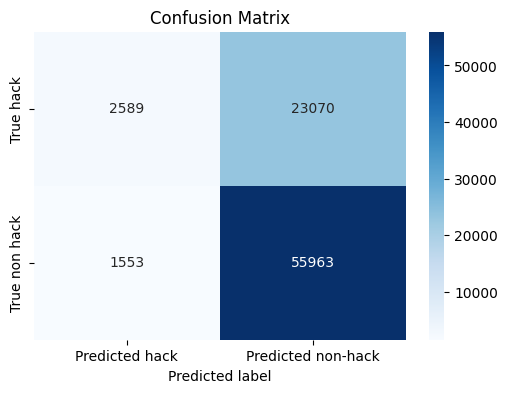

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Predicted hack", "Predicted non-hack"], yticklabels=["True hack", "True non hack"])
plt.xlabel('Predicted label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# prompt: I want a classification report for y_true_np, y_pred_np

print(classification_report(y_true_np, y_pred_np))

              precision    recall  f1-score   support

           0       0.63      0.10      0.17     25659
           1       0.71      0.97      0.82     57516

    accuracy                           0.70     83175
   macro avg       0.67      0.54      0.50     83175
weighted avg       0.68      0.70      0.62     83175



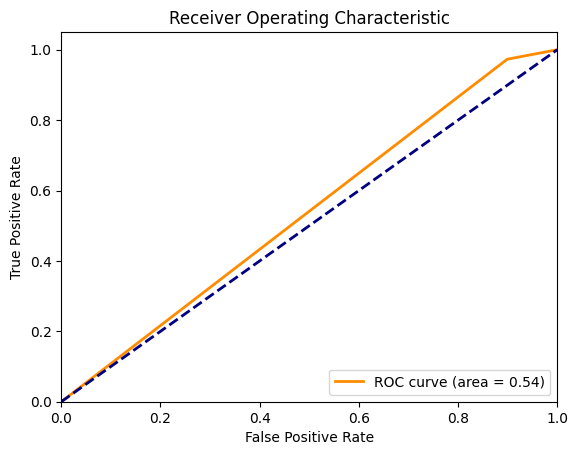

In [ ]:

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_true_np, y_pred_np)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
!nvidia-smi

Tue Oct 22 12:50:56 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0              46W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

## **Logistic Regression**

In [ ]:
logr_bin = LogisticRegression(random_state=123, max_iter=1000)

In [ ]:
logr_bin

LogisticRegression(max_iter=1000, random_state=123)

In [ ]:
from datetime import datetime
# Measure training time
start = datetime.now()
logr_bin.fit(X_train_lasso, y_train)
end = datetime.now()
lgr_trainTime_bin = end - start
print("Logistic Regression (Binary) Training Time:", lgr_trainTime_bin.total_seconds() * 10**6, "µs")

Logistic Regression (Binary) Training Time: 6074996.0 µs


In [ ]:

start = datetime.now()
y_pred_bin = logr_bin.predict(X_test_lasso)
end = datetime.now()
lgr_inferTime_bin = end - start
print("Logistic Regression (Binary) Inference Time:", lgr_inferTime_bin.total_seconds() * 10**6, "µs")

Logistic Regression (Binary) Inference Time: 42102.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred_bin))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred_bin))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred_bin)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred_bin) * 100)
print("Logistic Regression (Binary) Accuracy:", accuracy_score(y_test, y_pred_bin) * 100)

Mean Absolute Error: 0.3059212503757139
Mean Squared Error: 0.3059212503757139
Root Mean Squared Error: 0.5531014828905396
R² Score: -5.458221971251032
Logistic Regression (Binary) Accuracy: 69.40787496242862


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_logr = accuracy_score(y_test, y_pred_bin)
print(f"Original Accuracy (Binary): {original_accuracy_logr * 100:.5f}%")

Original Accuracy (Binary): 69.40787%



Occlusion Sensitivity Analysis (Logistic Regression - Binary):
jamLengthInMetersSum: Accuracy Drop = 0.0266
haltingDurationSum: Accuracy Drop = 0.0066
intervalHaltingDurationSum: Accuracy Drop = 0.0026
maxHaltingDuration: Accuracy Drop = 0.0023
meanOccupancy: Accuracy Drop = 0.0016
meanHaltingDuration: Accuracy Drop = 0.0010


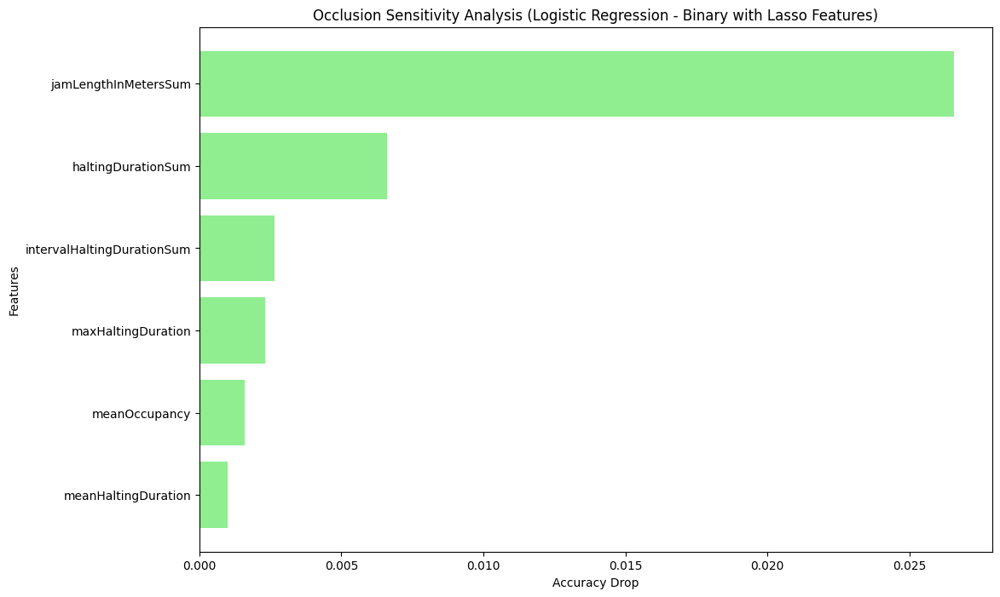

In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_logr = {}
for feature in selected_features:
    X_test_modified = X_test_lasso.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = logr_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_logr[feature] = original_accuracy_logr - new_accuracy

# Print the results
print("\nOcclusion Sensitivity Analysis (Logistic Regression - Binary):")
for feature, drop in sorted(accuracy_drop_logr.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")

# Sort the results for visualization
accuracy_drop_logr_sorted = sorted(accuracy_drop_logr.items(), key=lambda x: x[0], reverse=False)

# Visualization
import matplotlib.pyplot as plt

# Sort features by accuracy drop for better visualization
sorted_features = sorted(accuracy_drop_logr.items(), key=lambda x: x[1], reverse=True)
features = [item[0] for item in sorted_features]
accuracy_drops = [item[1] for item in sorted_features]

# Create the bar plot
plt.figure(figsize=(12, 8))
plt.barh(features, accuracy_drops, color='lightgreen')  # Use a distinct color for logistic regression
plt.xlabel('Accuracy Drop')
plt.ylabel('Features')
plt.title('Occlusion Sensitivity Analysis (Logistic Regression - Binary with Lasso Features)')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


In [ ]:
# accuracy_drop_logr_sorted = sorted(accuracy_drop_logr.items(), key=lambda x: x[0], reverse=False)

In [ ]:
# accuracy_drop_logr_sorted

In [ ]:
# Classification report
cls_report_bin = classification_report(y_true=y_test, y_pred=y_pred_bin)
print("Classification Report (Binary):\n", cls_report_bin)

Classification Report (Binary):
               precision    recall  f1-score   support

           0       0.55      0.04      0.08     25659
           1       0.70      0.98      0.82     57516

    accuracy                           0.69     83175
   macro avg       0.63      0.51      0.45     83175
weighted avg       0.65      0.69      0.59     83175



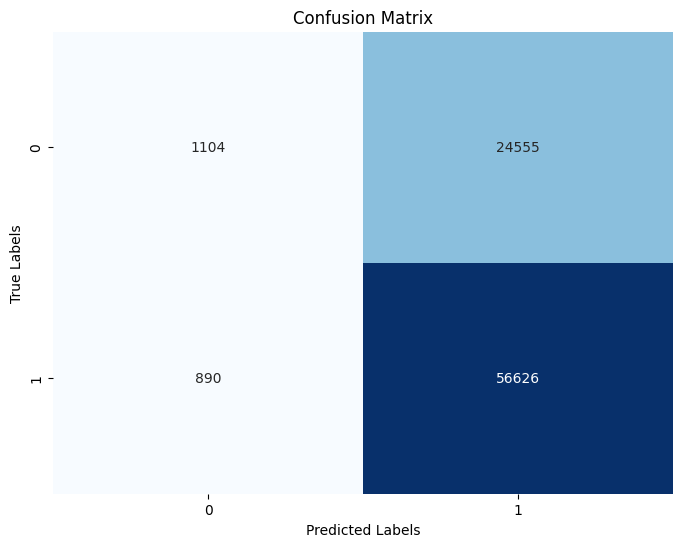

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(y_test, y_pred_bin)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


## **Random Forest**

In [ ]:
rf_bin = RandomForestClassifier(random_state=123)

In [ ]:
# Measure training time
start = datetime.now()
rf_bin.fit(X_train_lasso, y_train)
end = datetime.now()
rf_trainTime_bin = end - start  # Save training time
print("Random Forest (Binary) Training Time:", rf_trainTime_bin.total_seconds() * 10**6, "µs")

Random Forest (Binary) Training Time: 63441828.0 µs


In [ ]:
start = datetime.now()
y_pred4 = rf_bin.predict(X_test_lasso)
end = datetime.now()
rf_inferTime_bin = end - start  # Save inference time
print("Random Forest (Binary) Inference Time:", rf_inferTime_bin.total_seconds() * 10**6, "µs")

Random Forest (Binary) Inference Time: 2636952.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred4))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred4))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred4)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred4) * 100)
print("Random Forest (Binary) Accuracy:", accuracy_score(y_test, y_pred4) * 100)

Mean Absolute Error: 0.30527201683198074
Mean Squared Error: 0.30527201683198074
Root Mean Squared Error: 0.552514268441984
R² Score: -29.07231163022319
Random Forest (Binary) Accuracy: 69.47279831680191


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_rf = accuracy_score(y_test, y_pred4)
print(f"Original Accuracy (Random Forest - Binary): {original_accuracy_rf * 100:.5f}%")

Original Accuracy (Random Forest - Binary): 69.47280%


In [ ]:
# Occlusion Sensitivity Analysis for individual features
accuracy_drop_rf = {}
for feature in selected_features:
    X_test_modified = X_test_lasso.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = rf_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_rf[feature] = original_accuracy_rf - new_accuracy

print("\nOcclusion Sensitivity Analysis (Random Forest - Binary):")
for feature, drop in sorted(accuracy_drop_rf.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")


Occlusion Sensitivity Analysis (Random Forest - Binary):
meanOccupancy: Accuracy Drop = 0.0963
meanHaltingDuration: Accuracy Drop = 0.0762
jamLengthInMetersSum: Accuracy Drop = 0.0673
maxHaltingDuration: Accuracy Drop = 0.0261
intervalHaltingDurationSum: Accuracy Drop = 0.0016
haltingDurationSum: Accuracy Drop = -0.0019


In [ ]:
accuracy_drop_rf_sorted = sorted(accuracy_drop_rf.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_rf_sorted

[('haltingDurationSum', -0.0019236549443943929),
 ('intervalHaltingDurationSum', 0.0015629696423203887),
 ('jamLengthInMetersSum', 0.06727983168019236),
 ('maxHaltingDuration', 0.026125638713555777),
 ('meanHaltingDuration', 0.07615269011121129),
 ('meanOccupancy', 0.09629095281033961)]

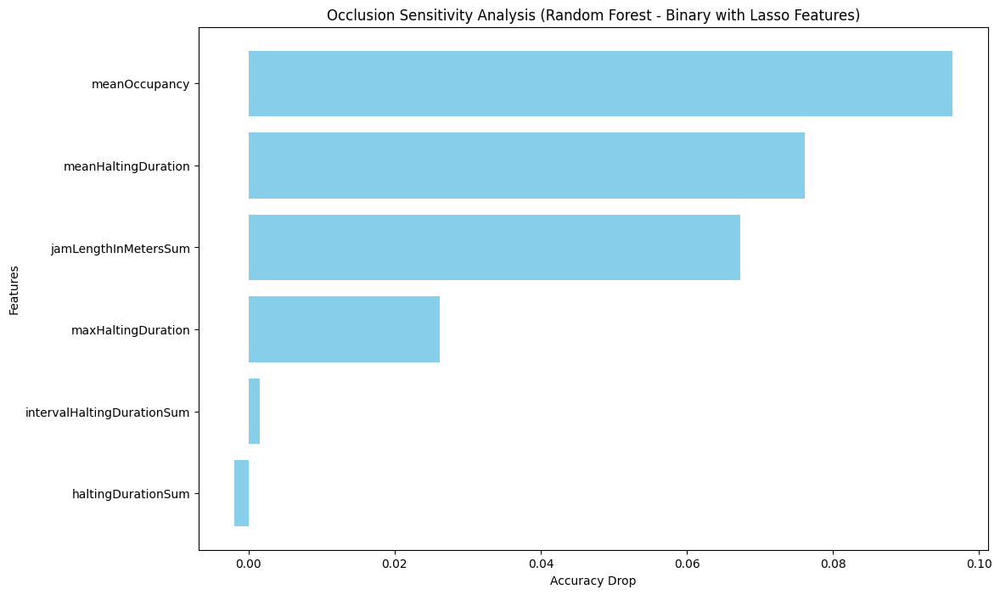

In [ ]:
import matplotlib.pyplot as plt

# Sort features by accuracy drop for better visualization
sorted_features = sorted(accuracy_drop_rf.items(), key=lambda x: x[1], reverse=True)
features = [item[0] for item in sorted_features]
accuracy_drops = [item[1] for item in sorted_features]

# Create the bar plot
plt.figure(figsize=(12, 8))
plt.barh(features, accuracy_drops, color='skyblue')
plt.xlabel('Accuracy Drop')
plt.ylabel('Features')
plt.title('Occlusion Sensitivity Analysis (Random Forest - Binary with Lasso Features)')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


In [ ]:
# Classification report
cls_report_rf = classification_report(y_true=y_test, y_pred=y_pred4)
print("Classification Report (Binary - Random Forest):\n", cls_report_rf)

Classification Report (Binary - Random Forest):
               precision    recall  f1-score   support

           0       0.51      0.22      0.31     25659
           1       0.72      0.90      0.80     57516

    accuracy                           0.69     83175
   macro avg       0.62      0.56      0.56     83175
weighted avg       0.66      0.69      0.65     83175



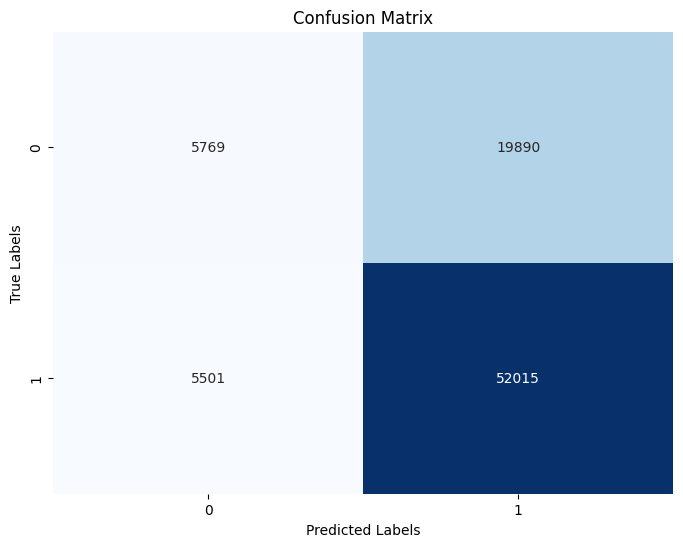

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(y_test, y_pred4)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

## **KNN**

In [ ]:
knn_bin = KNeighborsClassifier(n_neighbors=5)

In [ ]:
from datetime import datetime
# Measure training time
start = datetime.now()
knn_bin.fit(X_train_lasso, y_train)
end = datetime.now()
knn_trainTime_bin = end - start  # Save training time
print("KNN (Binary) Training Time:", knn_trainTime_bin.total_seconds() * 10**6, "µs")

KNN (Binary) Training Time: 603566.0 µs


In [ ]:
start = datetime.now()
y_pred3 = knn_bin.predict(X_test_lasso)
end = datetime.now()
knn_inferTime_bin = end - start  # Save inference time
print("KNN (Binary) Inference Time:", knn_inferTime_bin.total_seconds() * 10**6, "µs")

KNN (Binary) Inference Time: 143107903.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred3))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred3))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred3)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred3) * 100)
print("KNN (Binary) Accuracy:", accuracy_score(y_test, y_pred3) * 100)

Mean Absolute Error: 0.3212984670874662
Mean Squared Error: 0.3212984670874662
Root Mean Squared Error: 0.5668319566568792
R² Score: -37.79590659253309
KNN (Binary) Accuracy: 67.87015329125337


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_knn = accuracy_score(y_test, y_pred3)
print(f"Original Accuracy (KNN - Binary): {original_accuracy_knn * 100:.5f}%")

Original Accuracy (KNN - Binary): 67.87015%



Occlusion Sensitivity Analysis (KNN - Binary):
maxHaltingDuration: Accuracy Drop = 0.0260
jamLengthInMetersSum: Accuracy Drop = 0.0233
haltingDurationSum: Accuracy Drop = 0.0230
meanHaltingDuration: Accuracy Drop = 0.0216
intervalHaltingDurationSum: Accuracy Drop = 0.0044
meanOccupancy: Accuracy Drop = 0.0006


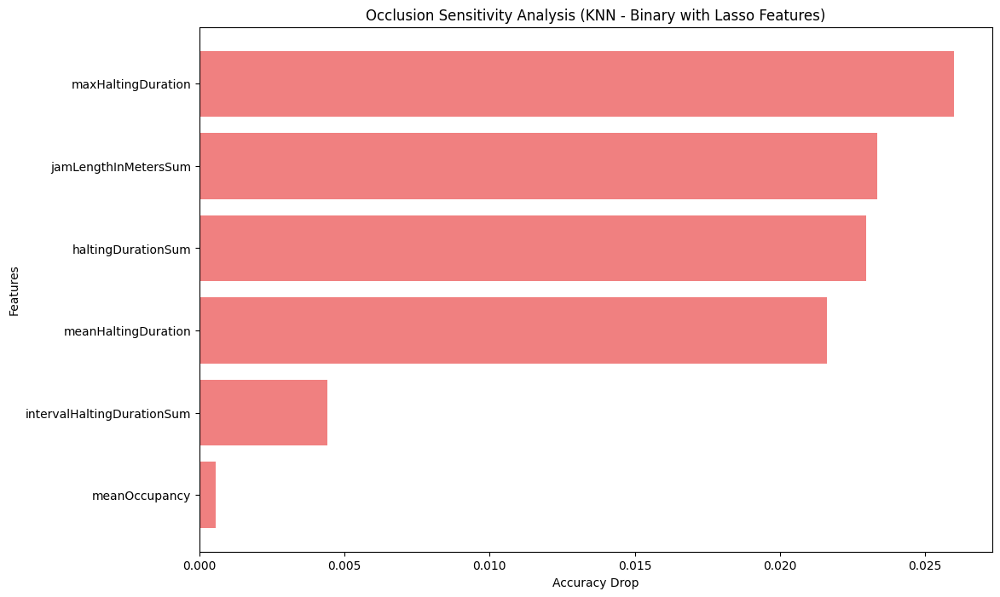

In [ ]:
# Occlusion Sensitivity Analysis for KNN
accuracy_drop_knn = {}
for feature in selected_features:
    X_test_modified = X_test_lasso.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = knn_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_knn[feature] = original_accuracy_knn - new_accuracy

# Print results
print("\nOcclusion Sensitivity Analysis (KNN - Binary):")
for feature, drop in sorted(accuracy_drop_knn.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")

# Visualization
sorted_features = sorted(accuracy_drop_knn.items(), key=lambda x: x[1], reverse=True)
features = [item[0] for item in sorted_features]
accuracy_drops = [item[1] for item in sorted_features]

plt.figure(figsize=(12, 8))
plt.barh(features, accuracy_drops, color='lightcoral')  # Distinct color for KNN
plt.xlabel('Accuracy Drop')
plt.ylabel('Features')
plt.title('Occlusion Sensitivity Analysis (KNN - Binary with Lasso Features)')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
accuracy_drop_knn_sorted = sorted(accuracy_drop_knn.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_knn_sorted

[]

In [ ]:
# Classification report
cls_report_knn = classification_report(y_true=y_test, y_pred=y_pred3)
print("Classification Report (Binary - KNN):\n", cls_report_knn)

Classification Report (Binary - KNN):
               precision    recall  f1-score   support

           0       0.46      0.21      0.29     25659
           1       0.72      0.89      0.79     57516

    accuracy                           0.68     83175
   macro avg       0.59      0.55      0.54     83175
weighted avg       0.64      0.68      0.64     83175



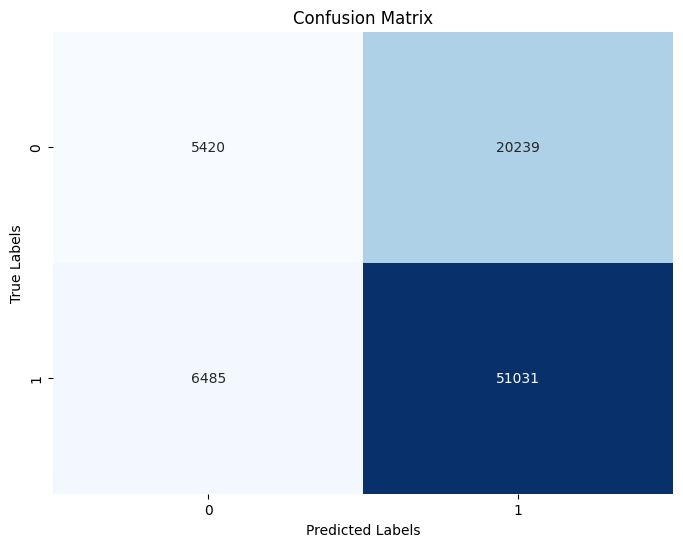

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(y_test, y_pred3)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

## **Decision Tree**

In [ ]:
dt_bin = DecisionTreeClassifier(random_state=123)

In [ ]:
# Measure training time
start = datetime.now()
dt_bin.fit(X_train_lasso, y_train)
end = datetime.now()
dt_trainTime_bin = end - start  # Save training time
print("Decision Tree (Binary) Training Time:", dt_trainTime_bin.total_seconds() * 10**6, "µs")

Decision Tree (Binary) Training Time: 3502791.0 µs


In [ ]:
start = datetime.now()
y_pred5 = dt_bin.predict(X_test_lasso)
end = datetime.now()
dt_inferTime_bin = end - start  # Save inference time
print("Decision Tree (Binary) Inference Time:", dt_inferTime_bin.total_seconds() * 10**6, "µs")

Decision Tree (Binary) Inference Time: 48918.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred5))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred5))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred5)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred5) * 100)
print("Decision Tree (Binary) Accuracy:", accuracy_score(y_test, y_pred5) * 100)

Mean Absolute Error: 0.32602344454463483
Mean Squared Error: 0.32602344454463483
Root Mean Squared Error: 0.5709846272402042
R² Score: -44.92999419507904
Decision Tree (Binary) Accuracy: 67.39765554553652


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_dt = accuracy_score(y_test, y_pred5)
print(f"Original Accuracy (Decision Tree - Binary): {original_accuracy_dt * 100:.5f}%")

Original Accuracy (Decision Tree - Binary): 67.39766%



Occlusion Sensitivity Analysis (Decision Tree - Binary):
meanOccupancy: Accuracy Drop = 0.0939
jamLengthInMetersSum: Accuracy Drop = 0.0651
meanHaltingDuration: Accuracy Drop = 0.0602
haltingDurationSum: Accuracy Drop = 0.0310
maxHaltingDuration: Accuracy Drop = 0.0284
intervalHaltingDurationSum: Accuracy Drop = 0.0239


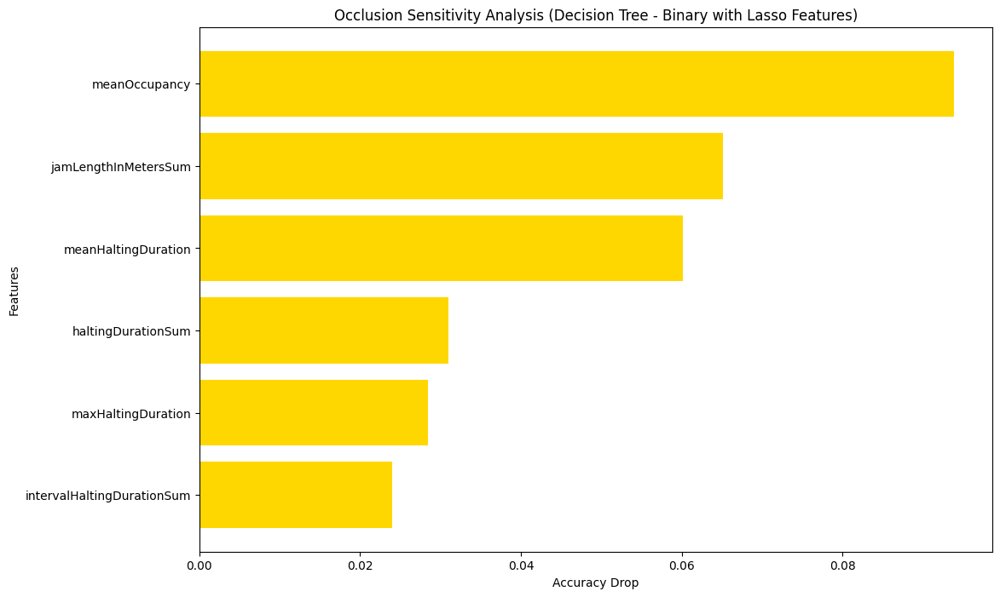

In [ ]:
# Occlusion Sensitivity Analysis for Decision Tree
accuracy_drop_dt = {}
for feature in selected_features:
    X_test_modified = X_test_lasso.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = dt_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_dt[feature] = original_accuracy_dt - new_accuracy

# Print results
print("\nOcclusion Sensitivity Analysis (Decision Tree - Binary):")
for feature, drop in sorted(accuracy_drop_dt.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")

# Visualization
sorted_features = sorted(accuracy_drop_dt.items(), key=lambda x: x[1], reverse=True)
features = [item[0] for item in sorted_features]
accuracy_drops = [item[1] for item in sorted_features]

plt.figure(figsize=(12, 8))
plt.barh(features, accuracy_drops, color='gold')  # Distinct color for Decision Tree
plt.xlabel('Accuracy Drop')
plt.ylabel('Features')
plt.title('Occlusion Sensitivity Analysis (Decision Tree - Binary with Lasso Features)')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
accuracy_drop_dt_sorted = sorted(accuracy_drop_dt.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_dt_sorted

NameError: name 'accuracy_drop_dt' is not defined

In [ ]:
# Classification report
cls_report_dt = classification_report(y_true=y_test, y_pred=y_pred5)
print("Classification Report (Binary - Decision Tree):\n", cls_report_dt)

Classification Report (Binary - Decision Tree):
               precision    recall  f1-score   support

           0       0.45      0.26      0.33     25659
           1       0.72      0.86      0.78     57516

    accuracy                           0.67     83175
   macro avg       0.59      0.56      0.56     83175
weighted avg       0.64      0.67      0.64     83175



##### Decision Tree Hyper Tuning


In [ ]:
from sklearn.model_selection import GridSearchCV
# Define the parameter grid for Decision Tree
param_grid_dt = {
    'criterion': ['gini', 'entropy'],  # Splitting criteria
    'max_depth': [None, 5, 10, 15, 20],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],  # Minimum samples required at each leaf node
    'max_features': ['auto', 'sqrt', 'log2']  # Number of features to consider for splitting
}

# Create a GridSearchCV object for Decision Tree with accuracy as the scoring metric
grid_search_dt = GridSearchCV(estimator=DecisionTreeClassifier(random_state=123),
                             param_grid=param_grid_dt,
                             cv=5,  # 5-fold cross-validation
                             scoring='accuracy')

# Fit the grid search to the training data
grid_search_dt.fit(X_train, y_train)

# Get the best parameters and the best score
best_params_dt = grid_search_dt.best_params_
best_score_dt = grid_search_dt.best_score_

print("Best Parameters for Decision Tree:", best_params_dt)
print("Best Accuracy for Decision Tree:", best_score_dt)

# Train the model with the best parameters
best_dt = DecisionTreeClassifier(**best_params_dt, random_state=123)
best_dt.fit(X_train, y_train)

# Make predictions on the test set
y_pred_best_dt = best_dt.predict(X_test)

# Evaluate the model
accuracy_best_dt = accuracy_score(y_test, y_pred_best_dt)
print("Accuracy with Best Parameters for Decision Tree:", accuracy_best_dt)


Best Parameters for Decision Tree: {'criterion': 'gini', 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2}

Best Accuracy for Decision Tree: 0.7572070405314804

Accuracy with Best Parameters for Decision Tree: 0.7560117302052786

## **MLP**

In [ ]:
mlp_bin = MLPClassifier(random_state=123, solver='adam', max_iter=8000)

In [ ]:
# Measure training time
start = datetime.now()
mlp_bin.fit(X_train_lasso, y_train)
end = datetime.now()
mlp_trainTime_bin = end - start  # Save training time
print("MLP (Binary) Training Time:", mlp_trainTime_bin.total_seconds() * 10**6, "µs")

MLP (Binary) Training Time: 393308095.0 µs


In [ ]:
start = datetime.now()
y_pred6 = mlp_bin.predict(X_test_lasso)
end = datetime.now()
mlp_inferTime_bin = end - start  # Save inference time
print("MLP (Binary) Inference Time:", mlp_inferTime_bin.total_seconds() * 10**6, "µs")

MLP (Binary) Inference Time: 480683.0 µs


In [ ]:
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred6))
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred6))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred6)))
print("R² Score:", metrics.explained_variance_score(y_test, y_pred6) * 100)
print("MLP (Binary) Accuracy:", accuracy_score(y_test, y_pred6) * 100)

Mean Absolute Error: 0.30456266907123536
Mean Squared Error: 0.30456266907123536
Root Mean Squared Error: 0.5518719680063804
R² Score: -5.444165217482766
MLP (Binary) Accuracy: 69.54373309287647


In [ ]:
# Store original accuracy for occlusion sensitivity analysis
original_accuracy_mlp = accuracy_score(y_test, y_pred6)
print(f"Original Accuracy (MLP - Binary): {original_accuracy_mlp * 100:.5f}%")

Original Accuracy (MLP - Binary): 69.54373%



Occlusion Sensitivity Analysis (MLP - Binary):
maxHaltingDuration: Accuracy Drop = 0.1142
jamLengthInMetersSum: Accuracy Drop = 0.1088
intervalHaltingDurationSum: Accuracy Drop = 0.0301
meanHaltingDuration: Accuracy Drop = 0.0101
meanOccupancy: Accuracy Drop = 0.0035
haltingDurationSum: Accuracy Drop = 0.0025


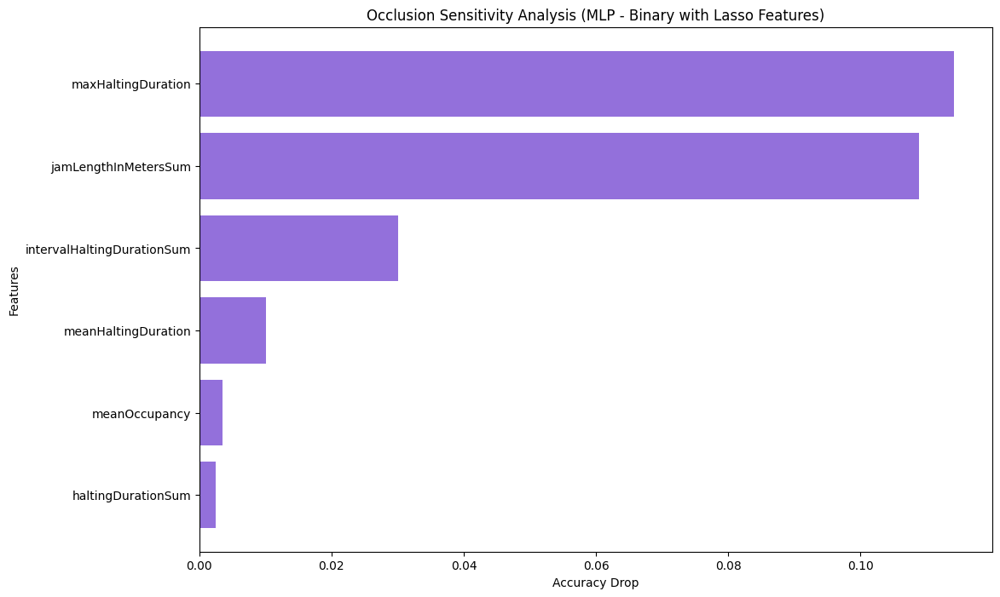

In [ ]:
# Occlusion Sensitivity Analysis for MLP
accuracy_drop_mlp = {}
for feature in selected_features:
    X_test_modified = X_test_lasso.copy()
    X_test_modified[feature] = 0  # Mask the feature by setting it to 0
    y_pred_modified = mlp_bin.predict(X_test_modified)
    new_accuracy = accuracy_score(y_test, y_pred_modified)
    accuracy_drop_mlp[feature] = original_accuracy_mlp - new_accuracy

# Print results
print("\nOcclusion Sensitivity Analysis (MLP - Binary):")
for feature, drop in sorted(accuracy_drop_mlp.items(), key=lambda x: x[1], reverse=True):
    print(f"{feature}: Accuracy Drop = {drop:.4f}")

# Visualization
sorted_features = sorted(accuracy_drop_mlp.items(), key=lambda x: x[1], reverse=True)
features = [item[0] for item in sorted_features]
accuracy_drops = [item[1] for item in sorted_features]

plt.figure(figsize=(12, 8))
plt.barh(features, accuracy_drops, color='mediumpurple')  # Distinct color for MLP
plt.xlabel('Accuracy Drop')
plt.ylabel('Features')
plt.title('Occlusion Sensitivity Analysis (MLP - Binary with Lasso Features)')
plt.gca().invert_yaxis()
plt.show()


In [ ]:
# Sorting the accuracy drop by feature name (alphabetical order)
accuracy_drop_mlp_sorted = sorted(accuracy_drop_mlp.items(), key=lambda x: x[0], reverse=False)
accuracy_drop_mlp_sorted

In [ ]:
# Classification report
cls_report_mlp = classification_report(y_true=y_test, y_pred=y_pred6)
print("Classification Report (Binary - MLP):\n", cls_report_mlp)

Classification Report (Binary - MLP):
               precision    recall  f1-score   support

           0       0.57      0.05      0.09     25659
           1       0.70      0.98      0.82     57516

    accuracy                           0.70     83175
   macro avg       0.64      0.52      0.45     83175
weighted avg       0.66      0.70      0.59     83175



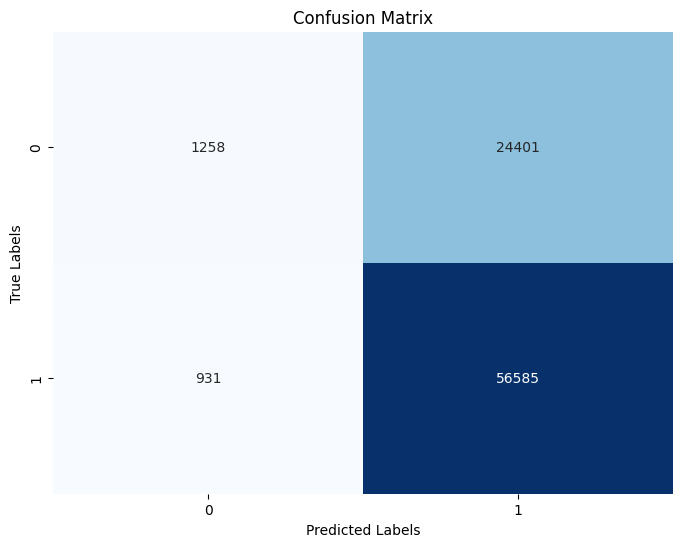

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix


cm = confusion_matrix(y_test, y_pred6)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

#### MLP Hyper Tuning

In [ ]:
# Define the parameter grid for MLP
param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],  # Different layer sizes
    'activation': ['relu', 'tanh', 'logistic'],  # Activation functions
    'alpha': [0.0001, 0.001, 0.01],  # Regularization parameter
    'learning_rate': ['constant', 'adaptive'],  # Learning rate strategy
    'solver': ['adam'],  # Solver for optimization
    'max_iter': [8000] # Max iterations
}

# Create a GridSearchCV object for MLP with accuracy as the scoring metric
grid_search_mlp = GridSearchCV(estimator=MLPClassifier(random_state=123),
                             param_grid=param_grid_mlp,
                             cv=5,  # 5-fold cross-validation
                             scoring='accuracy')

# Fit the grid search to the training data
grid_search_mlp.fit(X_train, y_train)

# Get the best parameters and the best score
best_params_mlp = grid_search_mlp.best_params_
best_score_mlp = grid_search_mlp.best_score_

print("Best Parameters for MLP:", best_params_mlp)
print("Best Accuracy for MLP:", best_score_mlp)

# Train the model with the best parameters
best_mlp = MLPClassifier(**best_params_mlp, random_state=123)
best_mlp.fit(X_train, y_train)

# Make predictions on the test set
y_pred_best_mlp = best_mlp.predict(X_test)

# Evaluate the model
accuracy_best_mlp = accuracy_score(y_test, y_pred_best_mlp)
print("Accuracy with Best Parameters for MLP:", accuracy_best_mlp)


Best Parameters for MLP: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (100, 50), 'learning_rate': 'constant', 'max_iter': 8000, 'solver': 'adam'}

Best Accuracy for MLP: 0.7457403434168546

Accuracy with Best Parameters for MLP: 0.7440469208211143

## **Graph**

In [ ]:
fullFeatureNames = []
for item in accuracy_drop_mlp_sorted:
    fullFeatureNames.append(item[0])

fullFeatureNames.remove('end')
fullFeatureNames.insert(len(fullFeatureNames)//2, 'end')

def reorderIntervalEnd(accuracyDropList, orderedFeatures):
    accuracyDict = dict(accuracyDropList)
    values = [accuracyDict[feature] for feature in accuracyDict]

    interval_end_value = accuracyDict.pop('end')
    reorderedValues = [accuracyDict[feature] for feature in orderedFeatures if feature != 'end']
    reorderedValues.insert(len(reorderedValues)//2, interval_end_value)

    return reorderedValues

In [ ]:
fullFeatureaccuracy_drops = {
    'Logistic Regression': reorderIntervalEnd(accuracy_drop_logr_sorted, fullFeatureNames),
    'KNN': reorderIntervalEnd(accuracy_drop_knn_sorted, fullFeatureNames),
    'Random Forest': reorderIntervalEnd(accuracy_drop_rf_sorted, fullFeatureNames),
    'Decision Tree': reorderIntervalEnd(accuracy_drop_dt_sorted, fullFeatureNames),
    'MLP': reorderIntervalEnd(accuracy_drop_mlp_sorted, fullFeatureNames),
}

In [ ]:
df_accuracy_drops_bin = pd.DataFrame(fullFeatureaccuracy_drops, index=fullFeatureNames)
df_accuracy_drops_bin = df_accuracy_drops_bin.T  # Transpose to have models as rows and features as columns

# Plotting the heatmap
plt.figure(figsize=(20, 4))
sns.heatmap(df_accuracy_drops_bin, annot=True, cmap="coolwarm", fmt=".2f", vmin=0, vmax=1)
plt.ylabel('Models')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0, ha='right')

plt.tight_layout()
plt.show()

In [ ]:
time_comparison_df = pd.DataFrame({
    'Binary Classifier Training Time': [
        lgr_trainTime_bin.total_seconds(),
        knn_trainTime_bin.total_seconds(),
        rf_trainTime_bin.total_seconds(),
        dt_trainTime_bin.total_seconds(),
        mlp_trainTime_bin.total_seconds()],

    'Binary Classifier Inference Time': [
        lgr_inferTime_bin.total_seconds(),
        knn_inferTime_bin.total_seconds(),
        rf_inferTime_bin.total_seconds(),
        dt_inferTime_bin.total_seconds(),
        mlp_inferTime_bin.total_seconds()]
},
    index=['Logistic Regression', 'K-NN', 'Random Forest', 'Decision Tree', 'MLP']
)

# Create a stacked bar chart to compare training and inference time
time_comparison_df.plot(kind='bar', stacked=True)

# Labels for x & y axis
plt.xlabel('Models')
plt.ylabel('Time (seconds)')

# Rotate x-tick labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


# LIME

In [ ]:
pip install lime

In [ ]:
# Import necessary libraries
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME explainer
explainer = LimeTabularExplainer(
    training_data=X_test_lasso.values,  # Use your normalized data
    feature_names=X_test_lasso.columns.tolist(),
    class_names=['Abnormal', 'Normal'],  # Adjust to your class names
    mode='classification'
)

# Function to apply LIME to a single instance of a model
def apply_lime_single_instance(model, model_name, instance_index):
    print(f"\nLIME Explanation for {model_name} - Instance {instance_index}")

    # Select the specific test instance
    instance = X_test_lasso.iloc[instance_index]

    # Generate LIME explanation
    explanation = explainer.explain_instance(
        data_row=instance.values,
        predict_fn=model.predict_proba  # Pass model's predict_proba method
    )

    # Show the explanation in the notebook
    explanation.show_in_notebook(show_table=True)


In [ ]:
apply_lime_single_instance(logr_bin, "Logistic Regression", instance_index=0)


LIME Explanation for Logistic Regression - Instance 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(rf_bin, "Random Forest", instance_index=0)


LIME Explanation for Random Forest - Instance 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(knn_bin, "KNN", instance_index=0)


LIME Explanation for KNN - Instance 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(dt_bin, "Decision Tree", instance_index=0)


LIME Explanation for Decision Tree - Instance 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(mlp_bin, "MLP", instance_index=0)


LIME Explanation for MLP - Instance 0


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(logr_bin, "Logistic Regression", instance_index=2200)


LIME Explanation for Logistic Regression - Instance 2200


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(rf_bin, "Random Forest", instance_index=2200)


LIME Explanation for Random Forest - Instance 2200


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(knn_bin, "KNN", instance_index=2200)


LIME Explanation for KNN - Instance 2200


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(dt_bin, "Decision Tree", instance_index=2200)


LIME Explanation for Decision Tree - Instance 2200


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [ ]:
apply_lime_single_instance(mlp_bin, "MLP", instance_index=2200)


LIME Explanation for MLP - Instance 2200


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
